# Validierung und Analyse von OBS Daten

* Einlesen der verschiedenen Datensätze (je ein File pro Fahrt)
* Datenaufbreitung (filtern, georeferenzieren)
* Visualisierung mit folium

In [1]:
import pandas as pd
import geopandas as gpd
import glob

In [44]:
files = glob.glob('raw_data/*.csv')
len(files)

36

In [46]:
data=pd.DataFrame()

for f in files:
    d = pd.read_csv(f , sep=';', skiprows=1)
    data = data.append(d)

In [47]:
# wie sieht Datensatz aus? (hier die ersten 20 Spalten)
data.iloc[: , :20]

,Date,Time,Millis,Comment,Latitude,Longitude,Altitude,Course,Speed,HDOP,Satellites,BatteryLevel,Left,Right,Confirmed,Marked,Invalid,InsidePrivacyArea,Factor,Measurements
0,06.03.2022,14:03:40,13258,NaN,52.479252,13.422084,68.24,113.56254,3.5,2.42,5,3.96,NaN,20.0,0,NaN,0,0,58,12
1,06.03.2022,14:03:40,14002,NaN,52.479252,13.422084,68.24,113.56254,3.5,2.42,5,3.94,NaN,20.0,0,NaN,0,0,58,15
2,06.03.2022,14:03:41,15002,NaN,52.479306,13.422095,71.76,113.56254,2.5,2.42,5,3.94,NaN,20.0,0,NaN,0,0,58,17
3,06.03.2022,14:03:42,16002,NaN,52.479280,13.422094,68.87,113.56254,0.9,2.42,5,3.93,NaN,20.0,0,NaN,0,0,58,15
4,06.03.2022,14:03:43,17002,NaN,52.479255,13.422129,65.22,113.56254,1.0,2.42,5,3.93,NaN,20.0,0,NaN,0,0,58,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
844,24.03.2022,11:03:47,1345003,NaN,NaN,NaN,NaN,NaN,NaN,99.99,0,3.87,29.0,26.0,0,NaN,0,0,58,17
845,24.03.2022,11:03:48,1346012,NaN,NaN,NaN,NaN,NaN,NaN,99.99,0,3.87,34.0,NaN,0,NaN,0,0,58,16
846,24.03.2022,11:03:49,1347000,NaN,NaN,NaN,NaN,NaN,NaN,99.99,0,3.87,41.0,48.0,0,NaN,0,0,58,16
847,24.03.2022,11:03:50,1348000,NaN,NaN,NaN,NaN,NaN,NaN,99.99,0,3.87,41.0,49.0,0,NaN,0,0,58,17


In [50]:
data= data[data.InsidePrivacyArea==0].copy()
# klappt nur wenn a) PrivacyArea diefiniert und b) konfiguriert ist, dass Daten trotzdem erhoben werden aber entsprechend getaggt

In [52]:
data.columns

Index(['Date', 'Time', 'Millis', 'Comment', 'Latitude', 'Longitude',
       'Altitude', 'Course', 'Speed', 'HDOP',
       ...
       'Rus27', 'Tms28', 'Lus28', 'Rus28', 'Tms29', 'Lus29', 'Rus29', 'Tms30',
       'Lus30', 'Rus30'],
      dtype='object', length=110)

### nur relevante spalten übernehmen

In [59]:
data=data[['Date', 'Time','Latitude','Longitude','Speed','Left','Right','Confirmed','Marked']].copy()
data

,Date,Time,Latitude,Longitude,Speed,Left,Right,Confirmed,Marked
0,06.03.2022,14:03:40,52.479252,13.422084,3.5,NaN,20.0,0,NaN
1,06.03.2022,14:03:40,52.479252,13.422084,3.5,NaN,20.0,0,NaN
2,06.03.2022,14:03:41,52.479306,13.422095,2.5,NaN,20.0,0,NaN
3,06.03.2022,14:03:42,52.479280,13.422094,0.9,NaN,20.0,0,NaN
4,06.03.2022,14:03:43,52.479255,13.422129,1.0,NaN,20.0,0,NaN
...,...,...,...,...,...,...,...,...,...
844,24.03.2022,11:03:47,NaN,NaN,NaN,29.0,26.0,0,NaN
845,24.03.2022,11:03:48,NaN,NaN,NaN,34.0,NaN,0,NaN
846,24.03.2022,11:03:49,NaN,NaN,NaN,41.0,48.0,0,NaN
847,24.03.2022,11:03:50,NaN,NaN,NaN,41.0,49.0,0,NaN


In [60]:
data_gdf = gpd.GeoDataFrame(
    data, geometry=gpd.points_from_xy(data.Longitude, data.Latitude), crs='EPSG:4326')

### remove all invalide data points f.e. if geometry missing

In [61]:
data_gdf = data_gdf[data_gdf.is_valid]
data_gdf

,Date,Time,Latitude,Longitude,Speed,Left,Right,Confirmed,Marked,geometry
0,06.03.2022,14:03:40,52.479252,13.422084,3.5,NaN,20.0,0,NaN,POINT (13.42208 52.47925)
1,06.03.2022,14:03:40,52.479252,13.422084,3.5,NaN,20.0,0,NaN,POINT (13.42208 52.47925)
2,06.03.2022,14:03:41,52.479306,13.422095,2.5,NaN,20.0,0,NaN,POINT (13.42209 52.47931)
3,06.03.2022,14:03:42,52.479280,13.422094,0.9,NaN,20.0,0,NaN,POINT (13.42209 52.47928)
4,06.03.2022,14:03:43,52.479255,13.422129,1.0,NaN,20.0,0,NaN,POINT (13.42213 52.47926)
...,...,...,...,...,...,...,...,...,...,...
854,24.03.2022,10:17:08,52.478835,13.424212,10.0,NaN,NaN,0,NaN,POINT (13.42421 52.47883)
855,24.03.2022,10:17:09,52.478842,13.424142,9.0,NaN,114.0,0,NaN,POINT (13.42414 52.47884)
0,24.03.2022,10:47:56,52.482076,13.426745,99.0,80.0,252.0,0,NaN,POINT (13.42675 52.48208)
2,24.03.2022,10:47:58,52.482494,13.427027,98.0,80.0,252.0,0,NaN,POINT (13.42703 52.48249)


<AxesSubplot:>

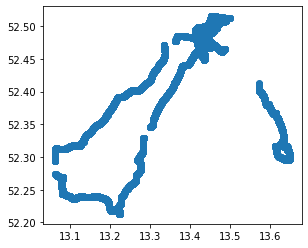

In [62]:
data_gdf.plot()

In [13]:
#data_gdf[80:]=data_gdf.copy()

In [14]:
#data_gdf.plot()

### schmeisse start raus wg privacy bisher nicht konfiguriert war (schrit eigentlich nicht nötig)

In [81]:
location_center = pd.DataFrame(
    {'name': ['center'],
     'Latitude': [52.479144],
     'Longitude': [13.42155]})

In [82]:
location_center = gpd.GeoDataFrame(
    location_center, geometry=gpd.points_from_xy(location_center.Longitude, location_center.Latitude), crs="EPSG:4326")
location_center = location_center.to_crs(epsg=25833) # UTM33
location_center.geometry=location_center.buffer(300)

In [83]:
location_center = location_center.to_crs("EPSG:4326") 

#location_center.plot()

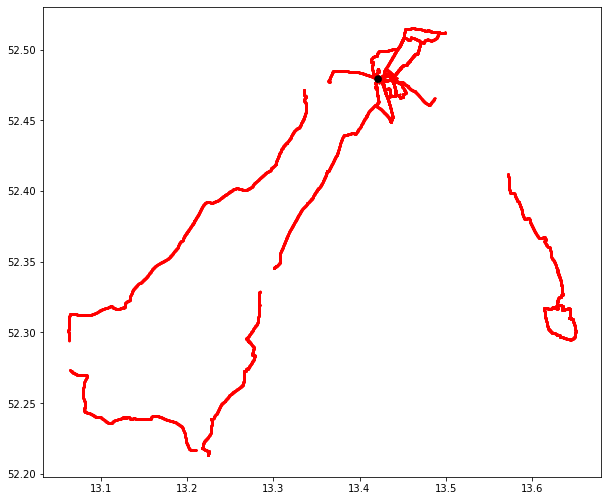

In [89]:
base = data_gdf.plot(color='red', markersize=1, figsize=(10,10))
location_center.plot(ax=base, color='k');

In [90]:
data_gdf=data_gdf.overlay(location_center, how='difference').copy()

# Bestätigte Überholvorgänge:


In [92]:
data_gdf[data_gdf.Confirmed!=0]
#data_gdf[data_gdf.Marked.notna()]

,Date,Time,Latitude,Longitude,Speed,Left,Right,Confirmed,Marked,geometry
59,06.03.2022,15:10:13,52.477003,13.426665,21.3,102.0,86.0,2,NaN,POINT (13.42667 52.47700)
70,06.03.2022,15:10:24,52.476413,13.427010,21.0,221.0,NaN,12,NaN,POINT (13.42701 52.47641)
82,06.03.2022,15:10:36,52.475733,13.427260,19.9,124.0,124.0,5,NaN,POINT (13.42726 52.47573)
90,06.03.2022,15:10:44,52.475279,13.427457,20.5,149.0,105.0,1,NaN,POINT (13.42746 52.47528)
123,06.03.2022,15:11:17,52.474794,13.427625,8.6,161.0,93.0,1,NaN,POINT (13.42762 52.47479)
...,...,...,...,...,...,...,...,...,...,...
39396,24.03.2022,10:13:44,52.474022,13.427774,13.4,136.0,121.0,1,NaN,POINT (13.42777 52.47402)
39437,24.03.2022,10:14:25,52.474648,13.427424,11.5,136.0,89.0,8,NaN,POINT (13.42742 52.47465)
39443,24.03.2022,10:14:31,52.474884,13.427255,12.8,137.0,NaN,12,NaN,POINT (13.42726 52.47488)
39485,24.03.2022,10:15:13,52.475928,13.426889,9.7,198.0,85.0,9,NaN,POINT (13.42689 52.47593)


In [74]:
data_gdf.Confirmed.value_counts()

0     40447
3        34
2        33
4        28
6        26
5        24
1        17
7        17
9        16
8        14
11       12
12        8
14        7
10        7
13        6
15        3
16        1
Name: Confirmed, dtype: int64

In [79]:
#data_gdf[data_gdf.Right>0]

In [80]:
#data_gdf[(data_gdf.Left>0)&data_gdf.geometry.x>0]

In [42]:
import folium
import branca


df=data_gdf[(data_gdf.Left>0)&data_gdf.geometry.x>0].copy()
#df=data_gdf#[data_gdf.Left>0].copy()
cent=df.dissolve().centroid[0]

basic_attribution='\u0026copy; \u003ca href=\"http://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors'
carto_attribution=basic_attribution + ' \u0026copy; \u003ca href=\"http://cartodb.com/attributions\"\u003eCartoDB\u003c/a\u003e, CartoDB \u003ca href =\"http://cartodb.com/attributions\"\u003eattributions\u003c/a\u003e' # <-- note this

btr_attr1=' | Ermöglicht durch  \u003ca href=\"https://www.openbikesensor.org/"\u003e  OpenBikeSensor \u003c/a\u003e'
btr_attr2='| Erfassung & Komposition erstellt von TH Wildau FG Radverkehr'
btr_attr = btr_attr1+btr_attr2


custom_attribution = carto_attribution + btr_attr

m = folium.Map(location=[cent.y, cent.x], 
               zoom_start=12,
              #min_zoom=13,
               #min_lat=- 90, max_lat=90, min_lon=- 180, max_lon=180
                #tiles='https://cartodb-basemaps-{s}.global.ssl.fastly.net/light_all/{z}/{x}/{y}.png', 
               tiles=None,
                attr=custom_attribution)


#m = folium.Map((52, 10),zoom_start=8, tiles=None)
#basemap: carto
folium.TileLayer(tiles='https://cartodb-basemaps-{s}.global.ssl.fastly.net/light_all/{z}/{x}/{y}.png',
                 name='Carto Light',
                 attr= carto_attribution + btr_attr,
                 show=True,
                 #overlay =True
                 ).add_to(m)

#basemap: sat
folium.TileLayer(tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                 name='Esri Satellite',
                 attr= 'Tiles &copy; Esri &mdash; Source: Esri, i-cubed, USDA, USGS, AEX, GeoEye, Getmapping, Aerogrid, IGN, IGP, UPR-EGP, and the GIS User Community' + btr_attr
                 ).add_to(m)
#basemap: OpenCycleMap
folium.TileLayer(tiles='https://tile.thunderforest.com/cycle/{z}/{x}/{y}.png?apikey=98ae7a41b031409bb9dbdad4b5720ae2',
                 name='OpenCycleMap',
                 attr=basic_attribution +  ' | \u0026copy; \u003ca href=\"https://www.opencyclemap.org/"\u003eOpenCycleMap\u003c/a\u003e' + btr_attr
                ).add_to(m)


def highlight_function(feature):
    return {
         'weight': 5,
        'color': 'gray'
    }

#def highlight_function_bpark_point(feature):
#    return {
#         'weight': 1,
#        'color': 'black'
#    }
#
#def highlight_function_bpark_poly(feature):
#    return {
#        # 'weight': 1,
#        #'color': 'black'
#    }
#


def size_producer(overtake_now):
    if overtake_now !=0:
        return 25
    else:
        return 3
    
def opacity_producer(overtake_now):
    if overtake_now !=0:
        return 0.9
    else:
        return 0.3



colorscale = branca.colormap.LinearColormap(['red','red','red', 'orange', 'yellow', 'green', 'green', 'green'], index=None, vmin=0, vmax=250, caption='Überholabstand [cm], Bestätigte Überholvorgänge: großer Marker')
  

fg_ueb = folium.FeatureGroup(name="ueberholdaten_left", show=True)
for index,row in df.iterrows():
    if row.Confirmed>0:
        folium.Circle(
            [row.geometry.y, row.geometry.x],
            radius=size_producer(row.Confirmed),
            opacity =opacity_producer(row.Confirmed),
            fill_opacity =opacity_producer(row.Confirmed),
            #nan_fill_color='gray',
             color=colorscale(row.Left),
             fill_color = colorscale(row.Left),
            #bubbling_mouse_events =highlight_function,
            #name=row.station_na,
          #  popup=folium.Popup('test'),
           # icon=folium.Icon(color=colr(row.Jahresmitt)),#, icon='info-sign'),
            tooltip =     '<b>Abstand Left (Kfz):</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str(float(row.Left))
                    + '<b><div style="height:3px;"><br></div>Abstand Right (Fahrbahnrand):</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str((float(row.Right)))
                    + '<b><div style="height:3px;"><br></div>Confirmed :</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str(int(row.Confirmed))
                   # + '<b><div style="height:3px;"><br></div>Marked :</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str(row.Marked)
            #        + '<b><div style="height:3px;"><br></div>Geschwindigkeit Radfahrer:</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str(int(row.speed*3.6)) +' km/h' 
            #       # + '<b><div style="height:3px;"><br></div>Distanz zur Straße:</b>'+'\xa0\xa0' + str(row.dist)  +' m'  
            #       # + '<b><div style="height:3px;"><br></div>DTV an der Straße:</b>'+'\xa0\xa0' + str(int(row.DTV))    +' Kfz'  
        ).add_to(fg_ueb)
        
m.add_child(fg_ueb)


fg_ueb = folium.FeatureGroup(name="ueberholdaten_left_kontinuierlich_ValidationOnly", show=False)
for index,row in df.iterrows():
    if row.Confirmed==0:
        folium.Circle(
            [row.geometry.y, row.geometry.x],
            radius=size_producer(row.Confirmed),
            opacity =opacity_producer(row.Confirmed),
            fill_opacity =opacity_producer(row.Confirmed),
            #nan_fill_color='gray',
             color=colorscale(row.Left),
             fill_color = colorscale(row.Left),
            #bubbling_mouse_events =highlight_function,
            #name=row.station_na,
          #  popup=folium.Popup('test'),
           # icon=folium.Icon(color=colr(row.Jahresmitt)),#, icon='info-sign'),
            tooltip =     '<b>Abstand Left (Kfz):</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str(float(row.Left))
                    + '<b><div style="height:3px;"><br></div>Abstand Right (Fahrbahnrand):</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str((float(row.Right)))
                    + '<b><div style="height:3px;"><br></div>Confirmed :</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str(int(row.Confirmed))
                   # + '<b><div style="height:3px;"><br></div>Marked :</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str(row.Marked)
                    + '<b><div style="height:3px;"><br></div>Date </b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str(row.Date)  
            #       # + '<b><div style="height:3px;"><br></div>Distanz zur Straße:</b>'+'\xa0\xa0' + str(row.dist)  +' m'  
            #       # + '<b><div style="height:3px;"><br></div>DTV an der Straße:</b>'+'\xa0\xa0' + str(int(row.DTV))    +' Kfz'  
        ).add_to(fg_ueb)
        
m.add_child(fg_ueb)
      
##df=data_gdf[data_gdf.Right>0].copy()
#df=data_gdf[(data_gdf.Right>0)&data_gdf.geometry.x>0].copy()
#
#fg_ueb = folium.FeatureGroup(name="ueberholdaten_right", show=False)
#for index,row in df.iterrows():
#    folium.Circle(
#        [row.geometry.y, row.geometry.x],
#        radius=size_producer(row.Confirmed),
#        opacity =opacity_producer(row.Confirmed),
#        fill_opacity =opacity_producer(row.Confirmed),
#        #nan_fill_color='gray',
#         color=colorscale(row.Right),
#         fill_color = colorscale(row.Right),
#        #bubbling_mouse_events =highlight_function,
#        #name=row.station_na,
#      #  popup=folium.Popup('test'),
#       # icon=folium.Icon(color=colr(row.Jahresmitt)),#, icon='info-sign'),
#        tooltip =     '<b>Abstand Left (Kfz):</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str(float(row.Left))
#                + '<b><div style="height:3px;"><br></div>Abstand Right (Fahrbahnrand):</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str((float(row.Right)))
#                + '<b><div style="height:3px;"><br></div>Confirmed :</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str(int(row.Confirmed))
#                + '<b><div style="height:3px;"><br></div>Marked :</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str(row.Marked)
#        #        + '<b><div style="height:3px;"><br></div>Geschwindigkeit Radfahrer:</b>'+'\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0' + str(int(row.speed*3.6)) +' km/h' 
#        #       # + '<b><div style="height:3px;"><br></div>Distanz zur Straße:</b>'+'\xa0\xa0' + str(row.dist)  +' m'  
#        #       # + '<b><div style="height:3px;"><br></div>DTV an der Straße:</b>'+'\xa0\xa0' + str(int(row.DTV))    +' Kfz'  
#    ).add_to(fg_ueb)
#        
#m.add_child(fg_ueb)
#


m.add_child(colorscale)

#folium.LayerControl().add_to(m)
folium.LayerControl(position='bottomleft',collapsed=False).add_to(m)

#m= add_click_link(m)

C:\Users\simon\AppData\Local\Temp/ipykernel_20284/211273707.py:7: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent=df.dissolve().centroid[0]


In [43]:
m

In [39]:
filename='OBSanalysis_validation_v04.html'
m.save(filename)